In [1]:
import os, math
import sys
from pathlib import Path
sys.path.append(str(Path(os.getcwd()).parent))

import numbers
from base64 import b64encode
from torchvision import transforms
import einops
import timm
from functools import partial
import requests, io
import torch
import torchvision
import torchvision.transforms as T
import torchvision.models as models
from torch import tensor,nn,optim
from torch.utils.data import DataLoader,default_collate
import torch.nn.functional as F
from PIL import Image
import PIL
from matplotlib import cm
from matplotlib import pyplot as plt
import seaborn as sns
from IPython.display import display, clear_output, HTML
import numpy as np
import open_clip
import moviepy.editor as mvp
from moviepy.video.io.ffmpeg_writer import FFMPEG_VideoWriter
from tqdm import tqdm_notebook, tnrange

from fastcore.foundation import L
import fastcore.all as fc
from miniai.datasets import *
from miniai.conv import *
from miniai.learner import *
from fastprogress import progress_bar,master_bar

## style transfer using Neural Cellular Automata

Idea is to use Neural Cellular Automata for style transfer. This model has very few parameters and thus is relatively small.
original implementation is from here: https://github.com/MagnusPetersen/Neural-Cellular-Automata-Image-Manipulation/blob/main/Colab%20Notebooks/StyleTransfer%20NCA%20.ipynb

Also inspiration is from here: https://github.com/johnowhitaker/aiaiart/blob/master/AIAIART_8.ipynb.
Code has been refactored using callbacks for more cleaner experimentation (this part uses heavily code from https://github.com/fastai/course22p2 course)

I've added more filter types (initially only sobel filter was used). There is a chance to play around with different style losses (original had only gram loss, I've added Optimal Transport loss and Vincent's loss (which is one type of optimal transport loss).

## Utility funcs

In [2]:
def to_nchw(img):
    img = torch.as_tensor(img).to(device)
    if len(img.shape) == 3:
        img = img[None,...]
    return img.permute(0, 3, 1, 2)


def calc_features(imgs, target_layers, vgg, device='cuda', reshape=False):
    mean = torch.tensor([0.485, 0.456, 0.406])[:,None,None].to(device)
    std = torch.tensor([0.229, 0.224, 0.225])[:,None,None].to(device)
    x = (imgs-mean) / std
    b, c, h, w = x.shape
    features=[]
    for i, layer in enumerate(vgg[:max(target_layers)+1]):
        x = layer(x)
        if i in target_layers:
            b, c, h, w = x.shape
            if reshape:
                features.append(x.reshape(b, c, h*w))
            else:
                features.append(x)
    return features

def gram_calculation(img, layers, vgg):
    return L(torch.einsum('bchw, bdhw -> cd', x, x) / (x.shape[-2]*x.shape[-1])
            for x in calc_features(img, layers, vgg))

def imread(url, max_size=None, mode=None):
    if url.startswith(('http:', 'https:')):
        # wikimedia requires a user agent
        headers = {
          "User-Agent": "Requests in Colab/0.0 (https://colab.research.google.com/; no-reply@google.com) requests/0.0"
        }
        r = requests.get(url, headers=headers)
        f = io.BytesIO(r.content)
    else:
        f = url
    img = PIL.Image.open(f)
    if max_size is not None:
        img.thumbnail((max_size, max_size),  PIL.Image.Resampling.LANCZOS)
    if mode is not None:
        img = img.convert(mode)
    img = np.float32(img)/255.0
    return img

class VideoWriter:
    def __init__(self, filename='_autoplay.mp4', fps=30.0, **kw):
        self.writer = None
        self.params = dict(filename=filename, fps=fps, **kw)

    def add(self, img):
        img = np.asarray(img)
        if self.writer is None:
            h, w = img.shape[:2]
            self.writer = FFMPEG_VideoWriter(size=(w, h), **self.params)
        if img.dtype in [np.float32, np.float64]:
            img = np.uint8(img.clip(0, 1)*255)
        if len(img.shape) == 2:
            img = np.repeat(img[..., None], 3, -1)
        self.writer.write_frame(img)

    def close(self):
        if self.writer:
            self.writer.close()

    def __enter__(self):
        return self

    def __exit__(self, *kw):
        self.close()
        if self.params['filename'] == '_autoplay.mp4':
            self.show()

    def show(self, **kw):
        self.close()
        fn = self.params['filename']
        display(mvp.ipython_display(fn, **kw))
        
def zoom(img, scale=4):
    img = np.repeat(img, scale, 0)
    img = np.repeat(img, scale, 1)
    return img
        
def create_video(model, path_or_url = "https://uploads3.wikiart.org/images/federico-zandomeneghi/lady-with-a-hat-1895.jpg", 
                 image_length = 512, frames = 200, steps_per_frame = 1, end_speed_up = 6, channel = 3):
    with VideoWriter() as vid, torch.no_grad():
        x = model.sample(path_or_url, sz=image_length)
        img = (x[0][...,channel:(channel+3),:,:]+0.5).permute(1, 2, 0).cpu()
        vid.add(zoom(img, 1))
        for k in tnrange(frames, leave=False):
            step_n = max(int(end_speed_up*k/frames), steps_per_frame)
            for i in range(step_n):
                x[::, 3:] = model(x)
            img = (x[0][...,channel:(channel+3),:,:]+0.5).permute(1, 2, 0).cpu()
            vid.add(zoom(img, 1))

## Style loss

In [3]:
# import pdb
class GramStyleLossToTarget():
    def __init__(self, target_im, vgg, size, style_layers=[1, 6, 11, 18, 25]):
        fc.store_attr()
        self.resize = T.Resize(size)
        self.target_im = self.resize(target_im)
        with torch.no_grad(): self.target_grams = gram_calculation(self.target_im, self.style_layers, self.vgg)
        
    def __call__(self, input_im, *args): 
        return sum((f1-f2).pow(2).mean() for f1, f2 in 
               zip(gram_calculation(input_im, self.style_layers,  self.vgg), self.target_grams))
    
#https://wandb.ai/johnowhitaker/style_loss_showdown/reports/An-Explanation-of-Style-Transfer-With-a-Showdown-of-Different-Techniques--VmlldzozMDIzNjg0
#https://github.com/johnowhitaker/tglcourse/blob/main/62_Generators_and_Losses.ipynb

class OTStyleLossToTarget(nn.Module):
    """ Optimal Transport Loss for style comparison, sliced Wasserstein 
    https://openaccess.thecvf.com/content/CVPR2021/papers/Heitz_A_Sliced_Wasserstein_Loss_for_Neural_Texture_Synthesis_CVPR_2021_paper.pdf"""
    def __init__(self, target, vgg, size=256, style_layers = [1, 6, 11, 18, 25], scale_factor=1e-5, device='cuda'):
        super(OTStyleLossToTarget, self).__init__()
        if device is None:
            device = torch.device('cuda:0' if torch.cuda.is_available() else 'cpu')
        self.device = device
        self.vgg=vgg
        self.resize = T.Resize(size)
        self.target = self.resize(target) # resize target image to size
        self.style_layers = style_layers
        self.scale_factor = scale_factor # Defaults tend to be very large, we scale to make them easier to work with
        with torch.no_grad():
            # self.target_features = calc_features_v2(self.target, self.style_layers, self.vgg, reshape=True)
            self.target_features = calc_features(self.target, self.style_layers, self.vgg, reshape=True)

    def project_sort(self, x, proj):
        #same as
        #output = torch.matmul(x.permute(0, 2, 1), proj)  # Shape: (b, c, n, p)
        #output = output.squeeze(-2).transpose(1, 2)  # Shape: (b, p, n)
        return torch.einsum('bcn,cp->bpn', x, proj).sort()[0]

    def ot_loss(self, source, target, proj_n=32):
        ch, n = source.shape[-2:]
        projs = F.normalize(torch.randn(ch, proj_n).to(self.device), dim=0)
        source_proj = self.project_sort(source, projs)
        target_proj = self.project_sort(target, projs)
        target_interp = F.interpolate(target_proj, n, mode='nearest')
        return (source_proj-target_interp).square().sum()

    def forward(self, inp, grams):
        inp = self.resize(inp) # set size (assumes square images)
        input_features=calc_features(inp, self.style_layers, self.vgg, reshape=True)
        l = 0
        # Run through all features and take l1 loss (mean error) between them
        return sum(self.ot_loss(x, y) for x, y in zip(input_features, self.target_features)) * self.scale_factor


class VincentStyleLossToTarget(nn.Module):
    """ Attempting to copy  """
    def __init__(self, target, vgg, size=256, style_layers = [1, 6, 11, 18, 25], scale_factor=1e-5, device='cuda'):
        super(VincentStyleLossToTarget, self).__init__()
        if device==None:
            device = torch.device('cuda:0' if torch.cuda.is_available() else 'cpu')
        self.resize = T.Resize(size)
        self.target = self.resize(target) # resize target image to size
        self.style_layers = style_layers
        self.scale_factor = scale_factor # Defaults tend to be very large, we scale to make them easier to work with
        self.vgg=vgg
        with torch.no_grad():
            self.target_features = calc_features(self.target, self.style_layers, self.vgg, reshape=True)

    def calc_2_moments(self, x):
        b, c, n = x.shape
        mu = x.mean(dim=-1, keepdim=True) # b, c, 1
        cov = torch.matmul(x-mu, torch.transpose(x-mu, -1, -2))
        return mu, cov

    def matrix_diag(self, diagonal):
        # Try to copy tf.diag
        N = diagonal.shape[-1]
        shape = diagonal.shape[:-1] + (N, N)
        device, dtype = diagonal.device, diagonal.dtype
        result = torch.zeros(shape, dtype=dtype, device=device)
        indices = torch.arange(result.numel(), device=device).reshape(shape)
        indices = indices.diagonal(dim1=-2, dim2=-1)
        result.view(-1)[indices] = diagonal
        return result

    def l2wass_dist(self, mean_stl, cov_stl, mean_synth, cov_synth):  
        # Calculate tr_cov and root_cov from mean_stl and cov_stl
        eigvals,eigvects = torch.linalg.eigh(cov_stl) # eig returns complex tensors, I think eigh matches tf self_adjoint_eig
        eigroot_mat = self.matrix_diag(torch.sqrt(eigvals.clip(0)))
        root_cov_stl = torch.matmul(torch.matmul(eigvects, eigroot_mat), torch.transpose(eigvects, -1, -2))
        tr_cov_stl = torch.sum(eigvals.clip(0), dim=1, keepdim=True)

        # eigvals_synth,eigvects_synth = torch.linalg.eigh(cov_synth) # Replaced withtorch.linalg.eigvalsh
        tr_cov_synth = torch.sum(torch.linalg.eigvalsh(cov_synth).clip(0), dim=1, keepdim=True)
        mean_diff_squared = torch.mean((mean_synth - mean_stl)**2)
        cov_prod = torch.matmul(torch.matmul(root_cov_stl,cov_synth),root_cov_stl)
        var_overlap = torch.sum(torch.sqrt(torch.linalg.eigvalsh(cov_prod).clip(0.1)), dim=1, keepdim=True) # .clip(0) meant errors getting eigvals 
        dist = mean_diff_squared+tr_cov_stl+tr_cov_synth-2*var_overlap
        return dist

    def forward(self, inp, grams):
        inp = self.resize(inp) # set size (assumes square images)
        input_features = calc_features(inp, self.style_layers, self.vgg, reshape=True) # get features
        l = 0
        for x, y in zip(input_features, self.target_features):
            mean_synth, cov_synth = self.calc_2_moments(x) # input mean and cov
            mean_stl, cov_stl = self.calc_2_moments(y) # target mean and cov
            l += self.l2wass_dist(mean_stl, cov_stl, mean_synth, cov_synth) 
        return l.mean() * self.scale_factor
    

## losses

In [4]:
def transfer_loss(grams_x, grams_y, weights):
    loss = 0.0
    j = 0
    for x, y in zip(grams_x, grams_y):
        loss = loss + (x-y).square().mean()*weights[j]
        j += 1
    return loss


EPS = 1e-6

# Copyright 2021 Mahmoud Afifi.
# Mahmoud Afifi, Marcus A. Brubaker, and Michael S. Brown. "HistoGAN:
# Controlling Colors of GAN-Generated and Real Images via Color Histograms."
# In CVPR, 2021.
# Implemetation source https://github.com/computer-vision2022/PAMA/tree/eef6e808bd6f4111deb818ce185b071137d2296d


class RGBuvHistBlock(nn.Module):
    def __init__(self, h=64, insz=150, resizing='interpolation',
                 method='inverse-quadratic', sigma=0.02, intensity_scale=True,
                 device='cuda'):
        """ Computes the RGB-uv histogram feature of a given image.
        Args:
          h: histogram dimension size (scalar). The default value is 64.
          insz: maximum size of the input image; if it is larger than this size, the
            image will be resized (scalar). Default value is 150 (i.e., 150 x 150
            pixels).
          resizing: resizing method if applicable. Options are: 'interpolation' or
            'sampling'. Default is 'interpolation'.
          method: the method used to count the number of pixels for each bin in the
            histogram feature. Options are: 'thresholding', 'RBF' (radial basis
            function), or 'inverse-quadratic'. Default value is 'inverse-quadratic'.
          sigma: if the method value is 'RBF' or 'inverse-quadratic', then this is
            the sigma parameter of the kernel function. The default value is 0.02.
          intensity_scale: boolean variable to use the intensity scale (I_y in
            Equation 2). Default value is True.
        Methods:
          forward: accepts input image and returns its histogram feature. Note that
            unless the method is 'thresholding', this is a differentiable function
            and can be easily integrated with the loss function. As mentioned in the
             paper, the 'inverse-quadratic' was found more stable than 'RBF' in our
             training.
        """
        super(RGBuvHistBlock, self).__init__()
        self.h = h
        self.insz = insz
        self.device = device
        self.resizing = resizing
        self.method = method
        self.intensity_scale = intensity_scale
        if self.method == 'thresholding':
            self.eps = 6.0 / h
        else:
            self.sigma = sigma

    def forward(self, x):
        x=x.to(self.device)
        x = torch.clamp(x, 0, 1)
        if x.shape[2] > self.insz or x.shape[3] > self.insz:
            if self.resizing == 'interpolation':
                x_sampled = F.interpolate(x, size=(self.insz, self.insz),
                                          mode='bilinear', align_corners=False)
            elif self.resizing == 'sampling':
                inds_1 = torch.LongTensor(
                    np.linspace(0, x.shape[2], self.h, endpoint=False)).to(
                    device=self.device)
                inds_2 = torch.LongTensor(
                    np.linspace(0, x.shape[3], self.h, endpoint=False)).to(
                    device=self.device)
                x_sampled = x.index_select(2, inds_1)
                x_sampled = x_sampled.index_select(3, inds_2)
            else:
                raise Exception(
                    f'Wrong resizing method. It should be: interpolation or sampling. '
                    f'But the given value is {self.resizing}.')
        else:
            x_sampled = x

        L = x_sampled.shape[0]  # size of mini-batch
        if x_sampled.shape[1] > 3:
            x_sampled = x_sampled[:, :3, :, :]
        X = torch.unbind(x_sampled, dim=0)
        hists = torch.zeros((x_sampled.shape[0], 3, self.h, self.h)).to(
            device=self.device)
        for l in range(L):
            I = torch.t(torch.reshape(X[l], (3, -1)))
            II = torch.pow(I, 2)
            if self.intensity_scale:
                Iy = torch.unsqueeze(torch.sqrt(II[:, 0] + II[:, 1] + II[:, 2] + EPS),
                                     dim=1)
            else:
                Iy = 1

            Iu0 = torch.unsqueeze(torch.log(I[:, 0] + EPS) - torch.log(I[:, 1] + EPS),
                                  dim=1)
            Iv0 = torch.unsqueeze(torch.log(I[:, 0] + EPS) - torch.log(I[:, 2] + EPS),
                                  dim=1)
            diff_u0 = abs(
                Iu0 - torch.unsqueeze(torch.tensor(np.linspace(-3, 3, num=self.h)),
                                      dim=0).to(self.device))
            diff_v0 = abs(
                Iv0 - torch.unsqueeze(torch.tensor(np.linspace(-3, 3, num=self.h)),
                                      dim=0).to(self.device))
            if self.method == 'thresholding':
                diff_u0 = torch.reshape(diff_u0, (-1, self.h)) <= self.eps / 2
                diff_v0 = torch.reshape(diff_v0, (-1, self.h)) <= self.eps / 2
            elif self.method == 'RBF':
                diff_u0 = torch.pow(torch.reshape(diff_u0, (-1, self.h)),
                                    2) / self.sigma ** 2
                diff_v0 = torch.pow(torch.reshape(diff_v0, (-1, self.h)),
                                    2) / self.sigma ** 2
                diff_u0 = torch.exp(-diff_u0)  # Radial basis function
                diff_v0 = torch.exp(-diff_v0)
            elif self.method == 'inverse-quadratic':
                diff_u0 = torch.pow(torch.reshape(diff_u0, (-1, self.h)),
                                    2) / self.sigma ** 2
                diff_v0 = torch.pow(torch.reshape(diff_v0, (-1, self.h)),
                                    2) / self.sigma ** 2
                diff_u0 = 1 / (1 + diff_u0)  # Inverse quadratic
                diff_v0 = 1 / (1 + diff_v0)
            else:
                raise Exception(
                    f'Wrong kernel method. It should be either thresholding, RBF,'
                    f' inverse-quadratic. But the given value is {self.method}.')
            diff_u0 = diff_u0.type(torch.float32)
            diff_v0 = diff_v0.type(torch.float32)
            a = torch.t(Iy * diff_u0)
            hists[l, 0, :, :] = torch.mm(a, diff_v0)

            Iu1 = torch.unsqueeze(torch.log(I[:, 1] + EPS) - torch.log(I[:, 0] + EPS),
                                  dim=1)
            Iv1 = torch.unsqueeze(torch.log(I[:, 1] + EPS) - torch.log(I[:, 2] + EPS),
                                  dim=1)
            diff_u1 = abs(
                Iu1 - torch.unsqueeze(torch.tensor(np.linspace(-3, 3, num=self.h)),
                                      dim=0).to(self.device))
            diff_v1 = abs(
                Iv1 - torch.unsqueeze(torch.tensor(np.linspace(-3, 3, num=self.h)),
                                      dim=0).to(self.device))

            if self.method == 'thresholding':
                diff_u1 = torch.reshape(diff_u1, (-1, self.h)) <= self.eps / 2
                diff_v1 = torch.reshape(diff_v1, (-1, self.h)) <= self.eps / 2
            elif self.method == 'RBF':
                diff_u1 = torch.pow(torch.reshape(diff_u1, (-1, self.h)),
                                    2) / self.sigma ** 2
                diff_v1 = torch.pow(torch.reshape(diff_v1, (-1, self.h)),
                                    2) / self.sigma ** 2
                diff_u1 = torch.exp(-diff_u1)  # Gaussian
                diff_v1 = torch.exp(-diff_v1)
            elif self.method == 'inverse-quadratic':
                diff_u1 = torch.pow(torch.reshape(diff_u1, (-1, self.h)),
                                    2) / self.sigma ** 2
                diff_v1 = torch.pow(torch.reshape(diff_v1, (-1, self.h)),
                                    2) / self.sigma ** 2
                diff_u1 = 1 / (1 + diff_u1)  # Inverse quadratic
                diff_v1 = 1 / (1 + diff_v1)

            diff_u1 = diff_u1.type(torch.float32)
            diff_v1 = diff_v1.type(torch.float32)
            a = torch.t(Iy * diff_u1)
            hists[l, 1, :, :] = torch.mm(a, diff_v1)

            Iu2 = torch.unsqueeze(torch.log(I[:, 2] + EPS) - torch.log(I[:, 0] + EPS),
                                  dim=1)
            Iv2 = torch.unsqueeze(torch.log(I[:, 2] + EPS) - torch.log(I[:, 1] + EPS),
                                  dim=1)
            diff_u2 = abs(
                Iu2 - torch.unsqueeze(torch.tensor(np.linspace(-3, 3, num=self.h)),
                                      dim=0).to(self.device))
            diff_v2 = abs(
                Iv2 - torch.unsqueeze(torch.tensor(np.linspace(-3, 3, num=self.h)),
                                      dim=0).to(self.device))
            if self.method == 'thresholding':
                diff_u2 = torch.reshape(diff_u2, (-1, self.h)) <= self.eps / 2
                diff_v2 = torch.reshape(diff_v2, (-1, self.h)) <= self.eps / 2
            elif self.method == 'RBF':
                diff_u2 = torch.pow(torch.reshape(diff_u2, (-1, self.h)),
                                    2) / self.sigma ** 2
                diff_v2 = torch.pow(torch.reshape(diff_v2, (-1, self.h)),
                                    2) / self.sigma ** 2
                diff_u2 = torch.exp(-diff_u2)  # Gaussian
                diff_v2 = torch.exp(-diff_v2)
            elif self.method == 'inverse-quadratic':
                diff_u2 = torch.pow(torch.reshape(diff_u2, (-1, self.h)),
                                    2) / self.sigma ** 2
                diff_v2 = torch.pow(torch.reshape(diff_v2, (-1, self.h)),
                                    2) / self.sigma ** 2
                diff_u2 = 1 / (1 + diff_u2)  # Inverse quadratic
                diff_v2 = 1 / (1 + diff_v2)
            diff_u2 = diff_u2.type(torch.float32)
            diff_v2 = diff_v2.type(torch.float32)
            a = torch.t(Iy * diff_u2)
            hists[l, 2, :, :] = torch.mm(a, diff_v2)

        # normalization
        hists_normalized = hists / (
                ((hists.sum(dim=1)).sum(dim=1)).sum(dim=1).view(-1, 1, 1, 1) + EPS)

        return hists_normalized


def calc_histogram_loss(input_hist, target_hist):
    histogram_loss = (1 / np.sqrt(2.0) * (torch.sqrt(torch.sum(
        torch.pow(torch.sqrt(target_hist) - torch.sqrt(input_hist), 2)))) /
                      input_hist.shape[0])

    return histogram_loss

## Gaussian smoothing

In [5]:
class GaussianSmoothing(nn.Module):
    """
    Apply gaussian smoothing on a
    1d, 2d or 3d tensor. Filtering is performed seperately for each channel
    in the input using a depthwise convolution.
    Arguments:
        channels (int, sequence): Number of channels of the input tensors. Output will
            have this number of channels as well.
        kernel_size (int, sequence): Size of the gaussian kernel.
        sigma (float, sequence): Standard deviation of the gaussian kernel.
        dim (int, optional): The number of dimensions of the data.
            Default value is 2 (spatial).
    """
    def __init__(self, channels, kernel_size, sigma, dim=2):
        super(GaussianSmoothing, self).__init__()
        if isinstance(kernel_size, numbers.Number):
            kernel_size = [kernel_size] * dim
        if isinstance(sigma, numbers.Number):
            sigma = [sigma] * dim

        # The gaussian kernel is the product of the
        # gaussian function of each dimension.
        kernel = 1
        meshgrids = torch.meshgrid(
            [
                torch.arange(size, dtype=torch.float32)
                for size in kernel_size
            ]
        )
        for size, std, mgrid in zip(kernel_size, sigma, meshgrids):
            mean = (size - 1) / 2
            kernel *= 1 / (std * math.sqrt(2 * math.pi)) * \
                      torch.exp(-((mgrid - mean) / std) ** 2 / 2)

        # Make sure sum of values in gaussian kernel equals 1.
        kernel = kernel / torch.sum(kernel)

        # Reshape to depthwise convolutional weight
        kernel = kernel.view(1, 1, *kernel.size())
        kernel = kernel.repeat(channels, *[1] * (kernel.dim() - 1))

        self.register_buffer('weight', kernel)
        self.groups = channels

        if dim == 1:
            self.conv = F.conv1d
        elif dim == 2:
            self.conv = F.conv2d
        elif dim == 3:
            self.conv = F.conv3d
        else:
            raise RuntimeError(
                'Only 1, 2 and 3 dimensions are supported. Received {}.'.format(dim)
            )

    def forward(self, input):
        """
        Apply gaussian filter to input.
        Arguments:
            input (torch.Tensor): Input to apply gaussian filter on.
        Returns:
            filtered (torch.Tensor): Filtered output.
        """
        return self.conv(input, weight=self.weight, groups=self.groups)

## NeuralCA

In [6]:
def perchannel_conv(x, filters):
    '''filters: [filter_n, h, w]'''
    b, ch, h, w = x.shape
    y = x.reshape(b*ch, 1, h, w)
    y = F.pad(y, [1, 1, 1, 1], 'circular') # << Note pad mode
    y = F.conv2d(y, filters[:,None])
    return y.reshape(b, -1, h, w)


class NeuralCA(nn.Module):
    def __init__(self, filters, hidden_n=90, num_channels_in=18, num_channels_out=15, chn_in_factor=4, blur_kernel=[3, 7, 15], device='cpu'):
        super().__init__()
        self.filters=filters
        self.device=device
        
        self.chn = num_channels_in
        self.chn_in_factor=chn_in_factor
        self.chn_out = num_channels_out
        self.w1 = nn.Conv2d(num_channels_in*self.chn_in_factor, hidden_n, 1)
        self.w2 = torch.nn.Conv2d(hidden_n, hidden_n, 1)
        self.w3 = nn.Conv2d(hidden_n, num_channels_out, 1, bias=True) #TODO
        
        if len(blur_kernel)>0:
            self.blur_layers = nn.ModuleList()
            self.pad_size = []
            for i in blur_kernel:
                self.blur_layers.append(GaussianSmoothing(1, kernel_size=i, sigma=2))
                self.pad_size.append(int((i-1)/2))
        else:
            self.blur_layers=None
            self.pad_size=None
            
        gain = 0.15
        self.w1.weight.data = self.w1.weight.data*gain
        self.w1.bias.data = self.w1.bias.data*gain
        self.w2.weight.data = self.w2.weight.data*gain
        self.w2.bias.data = self.w2.bias.data*gain
        self.w3.weight.data = self.w3.weight.data*gain
        self.w3.bias.data = self.w3.bias.data*gain
        self.to(device)

    def forward(self, x, update_rate=0.5):
        y = perchannel_conv(x, self.filters)  
        # pdb.set_trace()
        y = torch.concat((x, y), 1)
        y = torch.relu(self.w1(y))
        y = torch.relu(self.w2(y))
        y = self.w3(y)

        b, c, h, w = y.shape

        if self.pad_size is not None:
            for i in range(len(self.pad_size)):
                p_sz = self.pad_size[i]
                pad_blur = F.pad(x[::, -(i+2)][::, None], (p_sz, p_sz, p_sz, p_sz), mode='circular')
                x[::, -(i+2):-(i+1)] = self.blur_layers[i](pad_blur)

        return x[::, 3:]+y

    def to_rgb(self, x, idx):
        return x[...,idx:(idx+3),:,:]+0.5
    
    def transform(self, image_url_or_path, image_length = 512, n_iter=1000, channel=3, savename=None):
        x = self.sample(image_url_or_path, sz=image_length)
        with torch.no_grad():
            for _ in range(n_iter):
                x[::, 3:] = self(x)
        
        img = (x[0][...,channel:(channel+3),:,:]+0.5).permute(1, 2, 0).cpu()
        image=PIL.Image.fromarray(np.uint8(np.clip(img, 0, 1)*255))
        if savename is not None:
            image.save(savename) 
        return image
    
    def seed(self, n, images, target_encoding, sz=224):
        m = len(images)
        if n >= m:
            n = m
        start = torch.rand(n, self.chn, sz, sz)
        idx = np.random.choice(len(images), n, replace=False)
        image_seed = images[idx].permute(0, 3, 1, 2)
        targets = target_encoding[idx]
        start[::, :3, ::, ::] = image_seed
        start[::, 3:6, ::, ::] = image_seed
        start -= 0.5
        return start, targets
    
    def sample(self, image_url, sz=224):
        image = imread(image_url, max_size=sz)
        image=image[:, :, :3]
        image_seed = to_nchw(image)
        start = torch.rand(1, self.chn, image_seed.shape[2], image_seed.shape[3]).to(self.device)

        start[::, :3, ::, ::] = image_seed
        start[::, 3:6, ::, ::] = image_seed
        start -= 0.5
        return start

In [7]:
class NCAProgressCB(ProgressCB):
    
    def before_fit(self, learn):
        learn.epochs = self.mbar = master_bar(learn.epochs)
        self.first = True
        if hasattr(learn, 'metrics'): learn.metrics._log = self._log
        self.losses = []
        self.losses_style=[]
        self.losses_overflow=[]
        self.losses_content=[]
        self.losses_color=[]
    
    def after_batch(self, learn):
        learn.dl.comment = f'{learn.loss:.3f}'
        if not (hasattr(learn, 'metrics') and learn.training): return 
        self.losses.append(learn.loss.item())
        self.losses_style.append(learn.loss_style.item())
        self.losses_overflow.append(learn.loss_overflow.item())
        self.losses_content.append(learn.loss_content.item())
        self.losses_color.append(learn.loss_color.item())
            
        mbar = self.mbar
        if not hasattr(mbar, 'graph_fig'):
            mbar.graph_fig, mbar.graph_axs = plt.subplots(6, 1, figsize=(14, 12), constrained_layout=True)
            mbar.graph_out = display(mbar.graph_fig, display_id=True)

        # Update preview image every 64 iters
        if (len(self.losses))%64 != 10: return 
        
        # Show preview images:
        show_image(torchvision.utils.make_grid(learn.imgs), ax=mbar.graph_axs[0])
        
         # Plot losses:
        mbar.graph_axs[1].clear()
        mbar.graph_axs[1].plot(self.losses, '.', alpha=0.3)
        mbar.graph_axs[1].set_yscale('log')
        mbar.graph_axs[1].title.set_text('Overall loss')
        mbar.graph_axs[1].set_ylim(tensor(self.losses).min(), self.losses[0])
        
        mbar.graph_axs[2].clear()
        mbar.graph_axs[2].plot(self.losses_style, '.', alpha=0.3)
        mbar.graph_axs[2].set_yscale('log')
        mbar.graph_axs[2].title.set_text('Style loss')
        mbar.graph_axs[2].set_ylim(tensor(self.losses_style).min(), self.losses_style[0])
        
        mbar.graph_axs[3].clear()
        mbar.graph_axs[3].plot(self.losses_content, '.', alpha=0.3)
        mbar.graph_axs[3].set_yscale('log')
        mbar.graph_axs[3].title.set_text('Content loss')
        mbar.graph_axs[3].set_ylim(tensor(self.losses_content).min(), self.losses_content[0])
        
        mbar.graph_axs[4].clear()
        mbar.graph_axs[4].plot(self.losses_overflow, '.', alpha=0.3)
        mbar.graph_axs[4].set_yscale('log')
        mbar.graph_axs[4].title.set_text('Overflow loss')
        mbar.graph_axs[4].set_ylim(tensor(self.losses_overflow).min(), self.losses_overflow[0])
        
        mbar.graph_axs[5].clear()
        mbar.graph_axs[5].plot(self.losses_color, '.', alpha=0.3)
        mbar.graph_axs[5].set_yscale('log')
        mbar.graph_axs[5].title.set_text('Color loss')
        mbar.graph_axs[5].set_ylim(tensor(self.losses_color).min(), self.losses_color[0])
        
        # Update graph
        mbar.graph_out.update(mbar.graph_fig)

In [8]:
class NCACB(TrainCB):
    order = DeviceCB.order+1
    def __init__(self, ca, images, pool_images, pool_targets, target_color_hist, vgg, color_hist_obj, size=224, 
                 step_n_min=32, step_n_max=96, batch_size=4, 
                 style_w = 0.4, content_w = 1, color_w=2,
                 style_weights_raw = [256, 64, 16, 4, 1],
                 vgg_layers= [1, 6, 11, 20, 22, 29], 
                 content_weigths=[1], n_iter_insert_new=5):
        fc.store_attr()
        weight_sum = sum(abs(w) for w in style_weights_raw)
        self.style_weights = [w / weight_sum for w in style_weights_raw]


    def predict(self, learn): 
        # Pick some random samples from the pool
        batch_idx = np.random.choice(len(self.pool_images), 4, replace=False)
        self.batch_idx=batch_idx
        x = self.pool_images[self.batch_idx]
        target_content = self.pool_targets[self.batch_idx]
        #after n_iter_insert_new insert new element
        if learn.iter%self.n_iter_insert_new == 0:
            x[:1], target_content[:1] = learn.model.seed(1, self.images, target_encoding)
        
        self.target_content = [target_content]
        step_n = np.random.randint(32, 96)
        
        def run_n(x):
            x_clone = x.clone()
            x_clone[:, 3:] = learn.model(x_clone)
            return x_clone
        
        x = torch.utils.checkpoint.checkpoint_sequential([run_n]*step_n, 16, x)
        
        # Update pool
        with torch.no_grad(): 
            self.pool_images[batch_idx] = x
            self.pool_targets[batch_idx] = target_content[0]
        
        # and store preds
        learn.preds = x
        
    def get_loss(self, learn): 
        imgs= self.learn.model.to_rgb(self.learn.preds, 3)
        self.learn.imgs=imgs
        grams = gram_calculation(imgs, self.vgg_layers, self.vgg)

        grams_content = grams.pop(-2)
        grams_style = grams
        content_loss = transfer_loss(grams_content, self.target_content, self.content_weigths)*self.content_w
        style_loss=self.learn.loss_func(imgs, grams_style)*self.style_w
        overflow_loss = (learn.preds-learn.preds.clamp(-1.0, 1.0)).abs().sum()
        color_loss = calc_histogram_loss(self.color_hist_obj(imgs), self.target_color_hist)*self.color_w
        
        learn.loss = overflow_loss + style_loss +content_loss+color_loss
        learn.loss_style=style_loss
        learn.loss_overflow=overflow_loss
        learn.loss_content=content_loss
        learn.loss_color=color_loss
        
    def backward(self, learn):
        learn.loss.backward()
        # Gradient normalization:
        for p in learn.model.parameters():
            p.grad /= (p.grad.norm()+1e-8) 
        
    def before_fit(self, learn): self.learn=learn 

In [9]:
class BaseSchedCB(Callback):
    def __init__(self, sched): 
        self.sched = sched
        
    def before_fit(self, learn): 
        self.schedo = self.sched(learn.opt)
        
    def step_(self, learn):
        if learn.training: 
            self.schedo.step()
        
class BatchSchedCB(BaseSchedCB):
    def after_batch(self, learn):
        self.step_(learn) 

## Filters

In [10]:
#class to easily combine different filters
class Filters:
    def __init__(self, device='cuda'):
        self.device=device
        self.identity=tensor([[0.0,0.0,0.0],[0.0,1.0,0.0],[0.0,0.0,0.0]]).to(device)
        self.laplace=tensor([[1.0,2.0,1.0],[2.0,-12,2.0],[1.0,2.0,1.0]]).to(device)
        
        self.filters={'sobel': torch.stack([
            tensor([[-1.0,0.0,1.0],[-2.0,0.0,2.0],[-1.0,0.0,1.0]]),
            tensor([[-1.0,0.0,1.0],[-2.0,0.0,2.0],[-1.0,0.0,1.0]]).T,
        ]).to(device),
                      'scharr':torch.stack([
           tensor([ [-3, 0, 3], [-10, 0, 10], [-3, 0, 3]]),
           tensor([[-3, -10, -3], [0, 0, 0], [3, 10, 3]]),
        ]).to(device),
                      'pewitt':torch.stack([
           tensor([[-1, 0, 1], [-1, 0, 1], [-1, 0, 1]]),
           tensor([[-1, -1, -1], [0, 0, 0], [1, 1, 1]]),
        ]).to(device)}
        
    def __call__(self, filter_name):
        if isinstance(filter_name, str):
            return torch.cat((self.identity.unsqueeze(0), self.filters[filter_name], self.laplace.unsqueeze(0)), dim=0)
        if isinstance(filter_name,  (list, tuple)):
            for i, single_filter in enumerate(filter_name):
                if i==0:
                    filter_combined=torch.cat((self.identity.unsqueeze(0), self.filters[single_filter]), dim=0)
                else:
                    filter_combined=torch.cat((filter_combined, self.filters[single_filter]), dim=0)
            filter_combined=torch.cat((filter_combined, self.laplace.unsqueeze(0)), dim=0)
            return filter_combined
        

## calculate target style

In [11]:
def get_images_features(images_path, content_layers, vgg):
    images = torch.load(images_path)
    with torch.no_grad():
        target_encoding = torch.zeros(size = (images.shape[0], 512, 512))
        for i in range(images.shape[0]):
            target_encoding[i] = gram_calculation(images[i].float().permute([2, 0, 1])[None], content_layers, vgg)[0][0]
    return target_encoding, images


def get_data(style_img_path, images_path, size, vgg_layers, model,  content_layers, pool_size, vgg, hist):
    target_encoding, images=get_images_features(images_path, content_layers, vgg)
    style_img=imread(style_img_path, max_size=size)
    style_img=style_img[:, :, :3]#if alpha channel, disregard it
    with torch.no_grad():
        target_style = gram_calculation(to_nchw(style_img), vgg_layers, vgg)
        target_style.pop(-2)
        target_hist = hist(torch.tensor(style_img).permute([2, 0, 1])[None])
        pool_images, pool_targets = model.seed(pool_size, images, target_encoding)
    return images, pool_images, pool_targets, target_encoding, target_style, target_hist, style_img

## dataloader

In [12]:
class LengthDataset():
    def __init__(self, length=1): self.length=length
    def __len__(self): return self.length
    def __getitem__(self, idx): return 0,0

def get_dummy_dls(length=100):
    return DataLoaders(DataLoader(LengthDataset(length), batch_size=1),
                       DataLoader(LengthDataset(1), batch_size=1))

## setup for training

#### model

In [13]:
device = torch.device('cuda:0' if torch.cuda.is_available() else 'cpu')
filter_names=['sobel', 'pewitt']
# filter_names=['sobel']
# filter_names=['pewitt']
# filter_names=['scharr']
filters=Filters()
# model = NeuralCA(filters(['sobel']), device=device)
# model = NeuralCA(filters(['sobel']),chn_in_factor=5, device=device)
# model = NeuralCA(filters(['pewitt']),chn_in_factor=5, device=device)
#2 filters stacked:
model = NeuralCA(filters(filter_names),num_channels_in=18,chn_in_factor=7, blur_kernel=[], device=device)
# model = NeuralCA(filters(filter_names),chn_in_factor=5, blur_kernel=[], device=device)

#### params

In [14]:
vgg_layers = [1, 6, 11, 20, 22, 29] #layers for style
content_layers = [22]
size = 224
pool_size = 400
images_path="mixed_224.pt"
style_url= 'style_images/style.jpg'
# style_url= 'style_images/art.png'
# style_url='style_images/eesti_voo.png'
# style_url='style_images/monet.jpg'
# style_url='style_images/pasta.jpg'
# style_url='style_images/cows-suffering-picasso.jpg'
# style_url='style_images/piet-mondriaan-03.jpg'
#style_url='style_images/pencil.jpg'
# style_url='style_images/blone.jpg'
# style_url='style_images/banksy2.jpg'
# style_url='style_images/africa.jpg'
# style_url='style_images/sall.png'
# style_url='style_images/cell.jpg'
# style_url='style_images/18_03_53_Psyschflower-PATTERN-DESIGN-.jpg'
# style_url='style_images/pngtree-unique-abstract-hex-line-art-pattern-png-image_12966342.png'
# style_url='style_images/lines.jpg'
# style_url= 'style_images/microscope.jpg'
# style_url= 'style_images/bismuth.jpg'

# style_w = 0.4 #Ranges between 0.1 and 1 have been optimal in the past
style_w = 0.1 #Ranges between 0.1 and 1 have been optimal in the past
# style_w = 10.0 #Ranges between 0.1 and 1 have been optimal in the past
# content_w = 0.5
content_w = 1.0
# color_w=2.0
color_w=10.0
style_weights = [256, 64, 16, 4, 1]
content_weigths = [1] 
step_n_min=32
step_n_max=96
batch_size=4
n_iter_insert_new=5
n_iter=1000

vgg19 = timm.create_model('vgg19', pretrained=True).to(device).features

hist = RGBuvHistBlock(insz=64, h=256,
                      intensity_scale=True,
                      method='inverse-quadratic',
                      device=torch.device(device))

#### data

In [15]:
#training data is from original notebook
# !wget "https://drive.usercontent.google.com/download?id=19m4_uOTbMCowhvLNhY_GbYIBEMQDuO8y&export=download&authuser=1&confirm=t&uuid=d71476aa-f535-4489-818c-37b26ae0d47d&at=APZUnTU-wgs79iDs--eYw6KAgT9n%3A1720961914244" -O mixed_224.pt

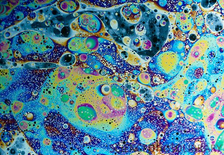

In [16]:
images, pool_images, pool_targets, target_encoding, target_style, target_hist, style_img=get_data(style_url, images_path, 
                                                                                     size, vgg_layers, model,  
                                                                                     content_layers, pool_size, vgg19, hist.to('cpu'))

PIL.Image.fromarray(np.uint8(np.clip(style_img, 0, 1)*255))

#### style loss object

In [17]:
#choose different style losses
syle_loss_obj=GramStyleLossToTarget(torch.tensor(style_img).permute([2, 0, 1]).unsqueeze(0).to(device),
                       size=size, vgg=vgg19, style_layers=vgg_layers)

# syle_loss_obj=OTStyleLossToTarget(torch.tensor(style_img).permute([2, 0, 1]).unsqueeze(0).to(device), 
#                                   vgg=vgg19, size=size, style_layers=vgg_layers, device=device)

# syle_loss_obj=VincentStyleLossToTarget(torch.tensor(style_img).permute([2, 0, 1]).unsqueeze(0).to(device), 
#                                   vgg=vgg19, size=size, style_layers=vgg_layers, device=device)

#### train

In [18]:
#If you stack more filters on top of each other, change channels num
opt_func=torch.optim.Adam
# lr_sched_func=partial(torch.optim.lr_scheduler.MultiStepLR, milestones=[1500, 3000, 4500], gamma=0.3)
lr_sched_func=partial(torch.optim.lr_scheduler.MultiStepLR, milestones=[1500, 3000, 4500], gamma=0.3)

cbs = [NCACB(model, images, pool_images.to(device), pool_targets.to(device), target_color_hist=target_hist, color_hist_obj=hist, 
             style_w = style_w, content_w = content_w, color_w=color_w, style_weights_raw = style_weights, 
               vgg_layers=vgg_layers, content_weigths=content_weigths,
             size=size, step_n_min=step_n_min, step_n_max=step_n_max, 
             batch_size=batch_size, vgg=vgg19, n_iter_insert_new=n_iter_insert_new), 
       BatchSchedCB(lr_sched_func), NCAProgressCB(), MetricsCB()]

learn = Learner(model, get_dummy_dls(n_iter), loss_func=syle_loss_obj, lr=1e-3, cbs=cbs, opt_func=opt_func)

loss,epoch,train
278.525,0,train
8.237,0,eval


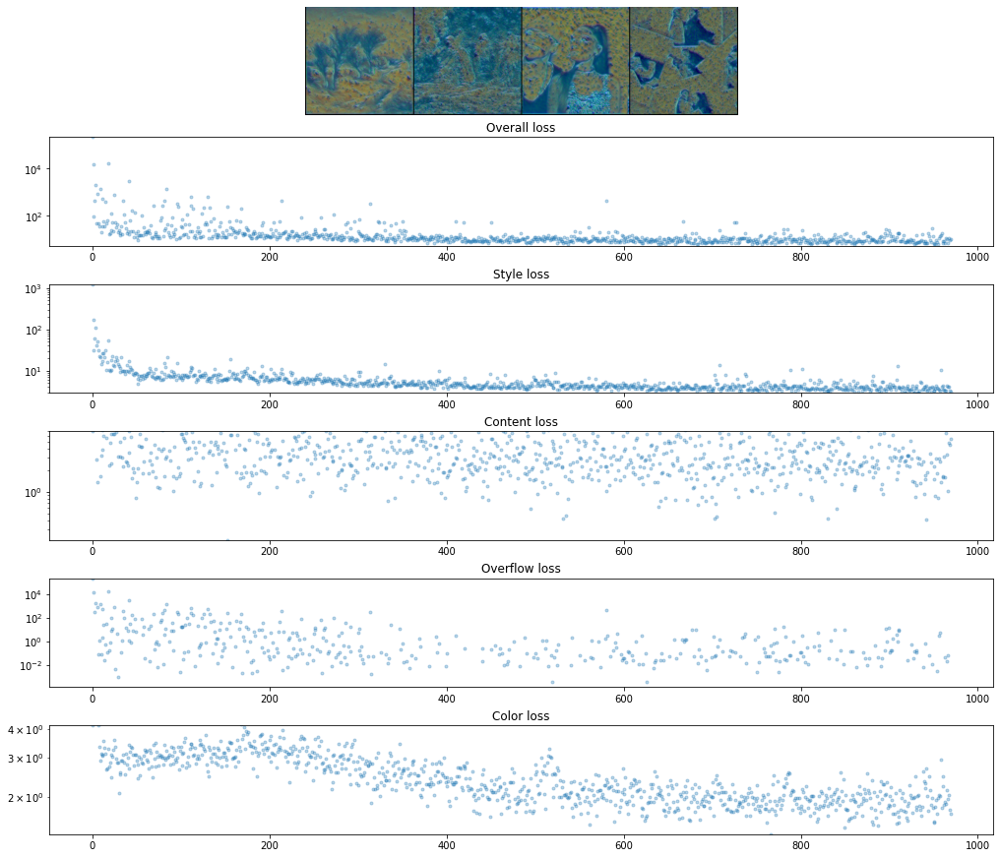

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

In [19]:
learn.fit(1)

## create a video

In [20]:
model=model.eval()

In [21]:
path_or_url = "https://i.natgeofe.com/n/2a832501-483e-422f-985c-0e93757b7d84/6.jpg"
create_video(model, path_or_url = path_or_url, image_length = 1024, frames = 600,
             steps_per_frame = 1, end_speed_up = 6)

  0%|          | 0/600 [00:00<?, ?it/s]

## Model size

In [22]:
#number or params in model
sum(p.numel() for p in learn.model.parameters()) # !!

20985

## transform picture

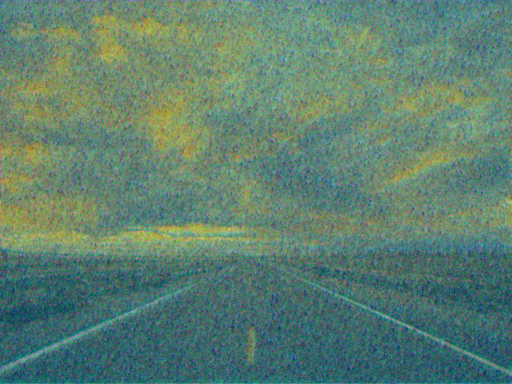

In [24]:
model.transform(path_or_url, channel=3, n_iter=35)

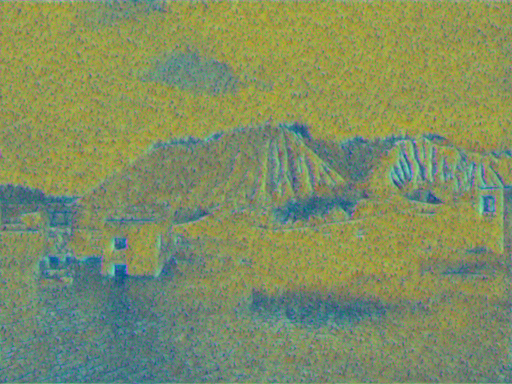

In [25]:
model.transform('content_images/murru.jpg', channel=3, n_iter=100, savename=f'output_blog/murru_{"_".join(filter_names)}_style_{style_url.split("/")[1].split(".")[0]}_gram_loss_iter_{n_iter}_stylew_{style_w}_contentw_{content_w}_colorw_{color_w}.png')

In [26]:
# model.transform('content_images/murru.jpg', channel=3, n_iter=100, savename='output_transfered/murru_sobel_pewitt_style_bismuth_wasserstein_loss_iter_100_new_iter10.png')

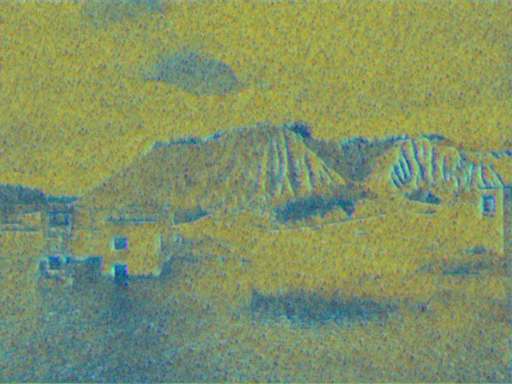

In [27]:
model.transform('content_images/murru.jpg', channel=3, n_iter=75)

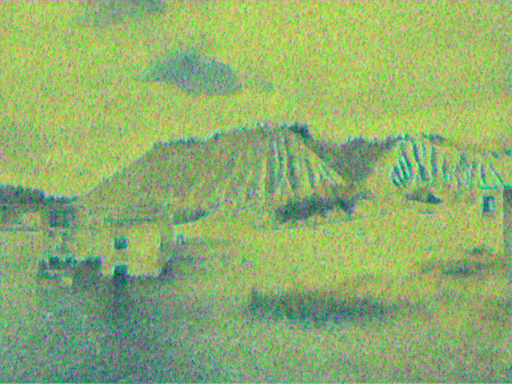

In [28]:
model.transform('content_images/murru.jpg', channel=3, n_iter=30)

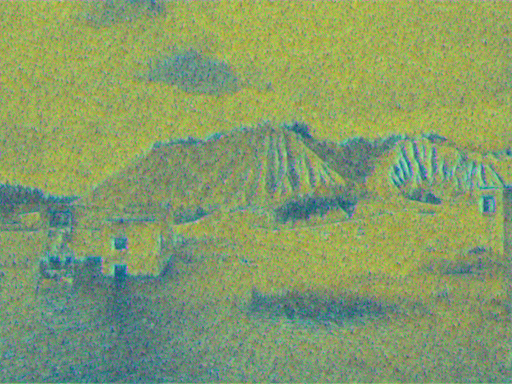

In [29]:
model.transform('content_images/murru.jpg', channel=3, n_iter=50)

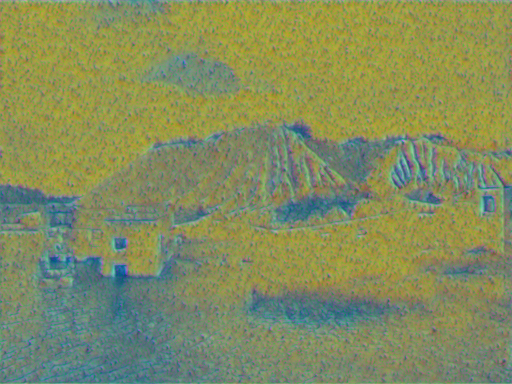

In [30]:
model.transform('content_images/murru.jpg', channel=3, n_iter=200)

# Stuff for post

## Show filters

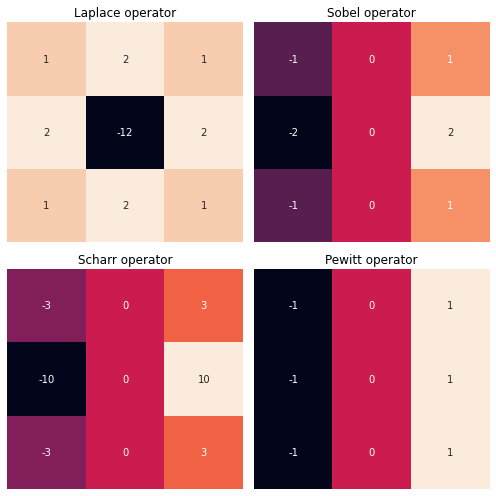

In [31]:
fig, axes = plt.subplots(2, 2, figsize=(7, 7))

# Plot each heatmap
sns.heatmap(filters.laplace.cpu(), ax=axes[0, 0], robust=True, annot=True, cbar=False, xticklabels=False, yticklabels=False)
axes[0, 0].set_title('Laplace operator')

sns.heatmap([[-1.0,0.0,1.0],[-2.0,0.0,2.0],[-1.0,0.0,1.0]], ax=axes[0, 1], robust=True, annot=True, cbar=False, xticklabels=False, yticklabels=False)
axes[0, 1].set_title('Sobel operator')

sns.heatmap([ [-3, 0, 3], [-10, 0, 10], [-3, 0, 3]], ax=axes[1, 0], robust=True, annot=True, cbar=False, xticklabels=False, yticklabels=False)
axes[1, 0].set_title('Scharr operator')

sns.heatmap([[-1, 0, 1], [-1, 0, 1], [-1, 0, 1]], ax=axes[1, 1], robust=True,  annot=True, cbar=False, xticklabels=False, yticklabels=False)
axes[1, 1].set_title('Pewitt operator')

# Adjust the layout
plt.tight_layout()

# Show the plot
plt.show()

## Rummu content images using different parameters

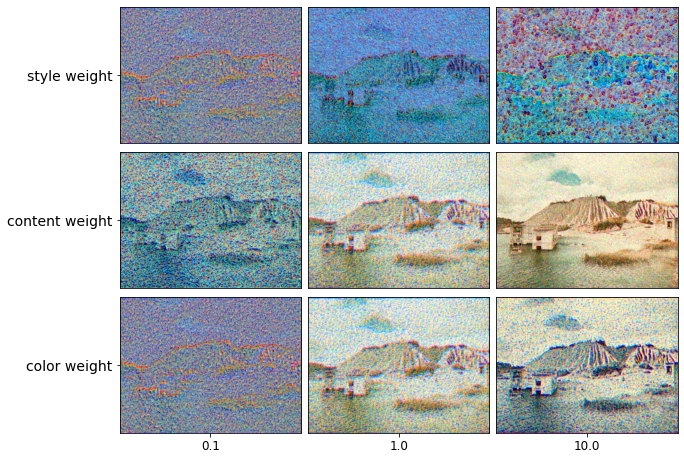

In [32]:
# Paths to your 9 images
folder_output='output_blog/'
image_paths = [
    f'{folder_output}murru_sobel_pewitt_style_style_wasserstein_loss_iter_1000_stylew_0.1_contentw_1.0_colorw_0.1.png', 
    f'{folder_output}murru_sobel_pewitt_style_style_wasserstein_loss_iter_1000_stylew_1.0_contentw_1.0_colorw_1.0.png', 
    f'{folder_output}murru_sobel_pewitt_style_style_wasserstein_loss_iter_1000_stylew_10.0_contentw_1.0_colorw_1.0.png',
    
    f'{folder_output}murru_sobel_pewitt_style_style_wasserstein_loss_iter_1000_stylew_0.1_contentw_0.1_colorw_1.0.png', 
    f'{folder_output}murru_sobel_pewitt_style_style_wasserstein_loss_iter_1000_stylew_0.1_contentw_1.0_colorw_1.0.png', 
    f'{folder_output}murru_sobel_pewitt_style_style_wasserstein_loss_iter_1000_stylew_0.1_contentw_10.0_colorw_1.0.png',
    
    f'{folder_output}murru_sobel_pewitt_style_style_wasserstein_loss_iter_1000_stylew_0.1_contentw_1.0_colorw_0.1.png', 
    f'{folder_output}murru_sobel_pewitt_style_style_wasserstein_loss_iter_1000_stylew_0.1_contentw_1.0_colorw_1.0.png', 
    f'{folder_output}murru_sobel_pewitt_style_style_wasserstein_loss_iter_1000_stylew_0.1_contentw_1.0_colorw_10.0.png'
]

# Create a figure with a 3x3 grid of subplots
fig, axes = plt.subplots(3, 3, figsize=(10, 8))

# Loop over the image paths and axes to load and display each image
x_names=['0.1', '1.0','10.0']
y_names=['style weight','content weight', 'color weight']
for i, ax in enumerate(axes.flat):
    img = Image.open(image_paths[i])
    ax.imshow(img)
    
    # Set x-ticks only for the last row
    if i // 3 == 2:  # Last row
        ax.set_xticks([img.width // 2])
        ax.set_xticklabels([x_names.pop(0)],  fontsize=12)
    else:
        ax.set_xticks([])

    # Set y-ticks only for the first column
    if i % 3 == 0:  # First column
        ax.set_yticks([img.height // 2])
        ax.set_yticklabels([y_names.pop(0)],  fontsize=14)
    else:
        ax.set_yticks([])

# Adjust spacing between images
plt.subplots_adjust(wspace=0.04, hspace=0.001)

# Show the grid of images
plt.show()

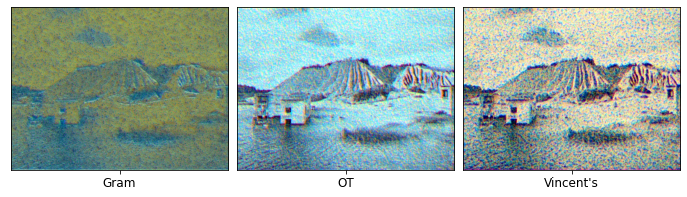

In [33]:
# Paths to your 3 images
image_paths = [
    f'{folder_output}murru_pewitt_style_style_gram_loss_iter_1000_stylew_0.1_contentw_1.0_colorw_10.0.png',
    f'{folder_output}murru_sobel_pewitt_style_style_ot_loss_iter_1000_stylew_0.1_contentw_1.0_colorw_10.0.png', 
    f'{folder_output}murru_sobel_pewitt_style_style_wasserstein_loss_iter_1000_stylew_0.1_contentw_1.0_colorw_10.0.png',
    
]

# Create a figure with a 1x3 grid of subplots
fig, axes = plt.subplots(1, 3, figsize=(12, 4))
x_names=['Gram', 'OT',"Vincent's"]
# Loop over the image paths and axes to load and display each image
for i, ax in enumerate(axes.flat):
    img = Image.open(image_paths[i])
    ax.imshow(img)
    
    # # Set x-ticks for each image
    # ax.set_xticks([img.width // 4, img.width // 2, 3 * img.width // 4])
    # ax.set_xticklabels(['Label 1', 'Label 2', 'Label 3'], fontsize=14)  # Set font size here
    ax.set_yticks([])
    # Set y-ticks for each image
    ax.set_xticks([img.width // 2])
    ax.set_xticklabels([x_names.pop(0)], fontsize=12)  # Set font size here

# Adjust spacing between images
plt.subplots_adjust(wspace=0.04)

# Show the grid of images
plt.show()

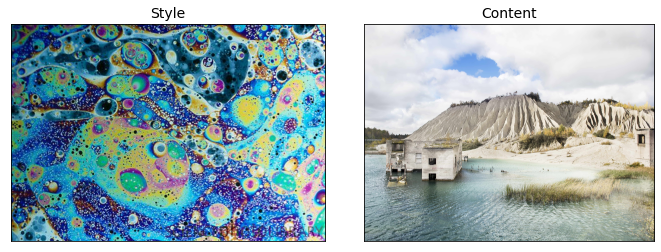

In [34]:
image_paths = [
    f'style_images/style.jpg',
    f'content_images/murru.jpg'
]

# Create a figure with a 1x3 grid of subplots
fig, axes = plt.subplots(1, 2, figsize=(12, 4))
x_names=['Style', 'Content']
# Loop over the image paths and axes to load and display each image
for i, ax in enumerate(axes.flat):
    img = Image.open(image_paths[i])
    ax.imshow(img)
    ax.set_title(x_names[i], fontsize=14)
    # # Set x-ticks for each image
    ax.set_yticks([])
    # # Set y-ticks for each image
    ax.set_xticks([])

# Adjust spacing between images
plt.subplots_adjust(wspace=0.04)

# Show the grid of images
plt.show()

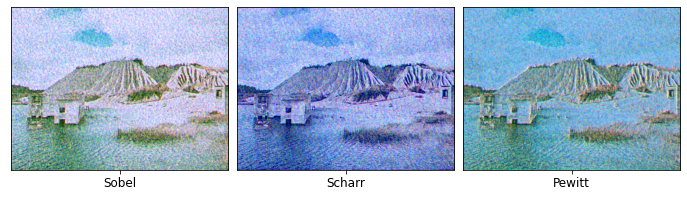

In [35]:
image_paths = [
    f'{folder_output}murru_sobel_style_style_wassersteinloss_iter_1000_stylew_0.1_contentw_5.0_colorw_1.0.png',
    f'{folder_output}murru_scharr_style_style_wasserstein_loss_iter_1000_stylew_0.1_contentw_5.0_colorw_1.0.png', 
    f'{folder_output}murru_pewitt_style_style_wasserstein_loss_iter_1000_stylew_0.1_contentw_5.0_colorw_1.0.png'
]

# Create a figure with a 1x3 grid of subplots
fig, axes = plt.subplots(1, 3, figsize=(12, 4))
x_names=['Sobel', 'Scharr',"Pewitt"]
# Loop over the image paths and axes to load and display each image
for i, ax in enumerate(axes.flat):
    img = Image.open(image_paths[i])
    ax.imshow(img)
    
    # # Set x-ticks for each image
    # ax.set_xticks([img.width // 4, img.width // 2, 3 * img.width // 4])
    # ax.set_xticklabels(['Label 1', 'Label 2', 'Label 3'], fontsize=14)  # Set font size here
    ax.set_yticks([])
    # Set y-ticks for each image
    ax.set_xticks([img.width // 2])
    ax.set_xticklabels([x_names.pop(0)], fontsize=12)  # Set font size here

# Adjust spacing between images
plt.subplots_adjust(wspace=0.04)

# Show the grid of images
plt.show()

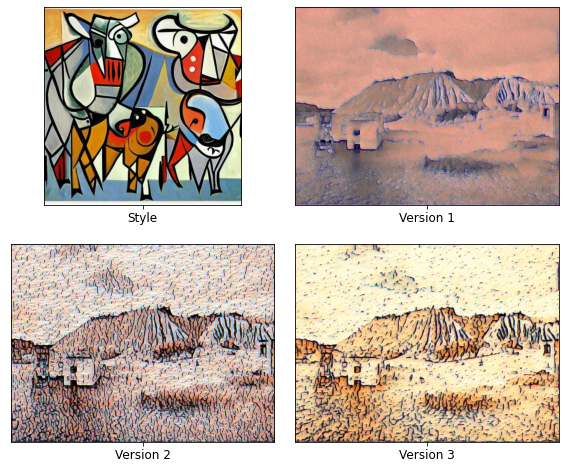

In [36]:
image_paths = [
    'style_images/cows-suffering-picasso.jpg',
    f'output_transfered/murru_sobel_pewitt_style_picasso_cows_gram_loss_iter_100.png',
    f'output_transfered/murru_sobel_pewitt_style_cows_wasserstein_loss_iter_100_new_iter10.png', 
    f'output_transfered/murru_sobel_pewitt_style_cows_wasserstein_loss_iter_100.png',
    
]

# Create a figure with a 1x3 grid of subplots
fig, axes = plt.subplots(2, 2, figsize=(10, 8))
x_names=['Style', 'Version 1',"Version 2", "Version 3"]
# Loop over the image paths and axes to load and display each image
for i, ax in enumerate(axes.flat):
    img = Image.open(image_paths[i])
    ax.imshow(img)
    
    # # Set x-ticks for each image
    # ax.set_xticks([img.width // 4, img.width // 2, 3 * img.width // 4])
    # ax.set_xticklabels(['Label 1', 'Label 2', 'Label 3'], fontsize=14)  # Set font size here
    ax.set_yticks([])
    # Set y-ticks for each image
    ax.set_xticks([img.width // 2])
    ax.set_xticklabels([x_names.pop(0)], fontsize=12)  # Set font size here

# Adjust spacing between images
plt.subplots_adjust(wspace=0.04)

# Show the grid of images
plt.show()

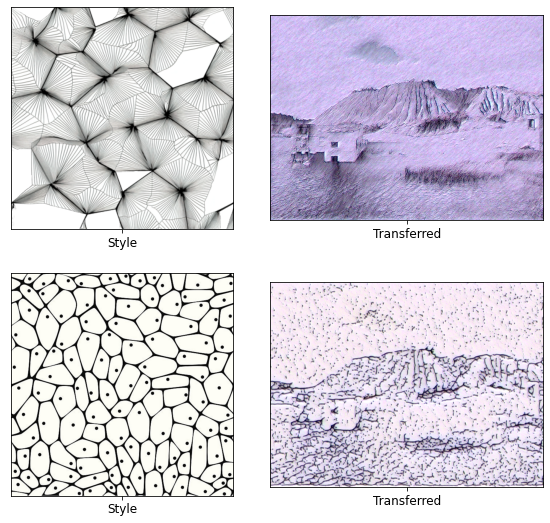

In [37]:
image_paths = [
    'style_images/pngtree-unique-abstract-hex-line-art-pattern-png-image_12966342.png',
    f'output_transfered/murru_sobel_pewitt_style_pngtree_waastestein_loss_iter_100.png',
    f'style_images/cell.jpg', 
    f'output_transfered/murru_sobel_pewitt_style_cell_gram_loss_iter_100.png',
    
]

# Create a figure with a 1x3 grid of subplots
fig, axes = plt.subplots(2, 2, figsize=(10, 9))
x_names=['Style', 'Transferred',"Style", "Transferred"]
# Loop over the image paths and axes to load and display each image
for i, ax in enumerate(axes.flat):
    img = Image.open(image_paths[i])
    ax.imshow(img)
    
    # # Set x-ticks for each image
    # ax.set_xticks([img.width // 4, img.width // 2, 3 * img.width // 4])
    # ax.set_xticklabels(['Label 1', 'Label 2', 'Label 3'], fontsize=14)  # Set font size here
    ax.set_yticks([])
    # Set y-ticks for each image
    ax.set_xticks([img.width // 2])
    ax.set_xticklabels([x_names.pop(0)], fontsize=12)  # Set font size here

# Adjust spacing between images
plt.subplots_adjust(wspace=0.04)

# Show the grid of images
plt.show()